In [56]:
import pandas as pd
import numpy as np
import os
import math

import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
# use get_db_url function to connect to the codeup db
from env import get_db_url
from sklearn.impute import SimpleImputer

# custom module imports
# import acquire as aq
import zillow_wrangle

In [2]:
df = zillow_wrangle.zillow_data()

In [3]:
df.head()

,typeconstructiontypeid,heatingorsystemtypeid,buildingclasstypeid,architecturalstyletypeid,airconditioningtypeid,parcelid,id,basementsqft,bathroomcnt,bedroomcnt,...,taxdelinquencyyear,censustractandblock,id,logerror,transactiondate,airconditioningdesc,architecturalstyledesc,buildingclassdesc,heatingorsystemdesc,typeconstructiondesc
0,NaN,NaN,NaN,NaN,NaN,14297519,1727539,NaN,3.5,4.0,...,NaN,6.059063e+13,0,0.025595,2017-01-01,None,None,None,None,None
1,NaN,NaN,NaN,NaN,NaN,17052889,1387261,NaN,1.0,2.0,...,NaN,6.111001e+13,1,0.055619,2017-01-01,None,None,None,None,None
2,NaN,NaN,NaN,NaN,NaN,14186244,11677,NaN,2.0,3.0,...,NaN,6.059022e+13,2,0.005383,2017-01-01,None,None,None,None,None
3,NaN,2.0,NaN,NaN,NaN,12177905,2288172,NaN,3.0,4.0,...,NaN,6.037300e+13,3,-0.103410,2017-01-01,None,None,None,Central,None
4,NaN,2.0,NaN,NaN,1.0,10887214,1970746,NaN,3.0,3.0,...,NaN,6.037124e+13,4,0.006940,2017-01-01,Central,None,None,Central,None


In [4]:
df = zillow_wrangle.keep_col(df)

In [5]:
df = zillow_wrangle.trim_bad_data_zillow(df)

In [6]:
df = zillow_wrangle.handle_missing_values(df)

In [7]:
df.shape

(72682, 36)

In [8]:
df.head()

,heatingorsystemtypeid,parcelid,id,bathroomcnt,bedroomcnt,buildingqualitytypeid,calculatedbathnbr,calculatedfinishedsquarefeet,finishedsquarefeet12,fips,...,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,censustractandblock,id,logerror,transactiondate,heatingorsystemdesc
0,NaN,14297519,1727539,3.5,4.0,NaN,3.5,3100.0,3100.0,6059.0,...,485713.0,1023282.0,2016.0,537569.0,11013.72,6.059063e+13,0,0.025595,2017-01-01,None
1,NaN,17052889,1387261,1.0,2.0,NaN,1.0,1465.0,1465.0,6111.0,...,88000.0,464000.0,2016.0,376000.0,5672.48,6.111001e+13,1,0.055619,2017-01-01,None
2,NaN,14186244,11677,2.0,3.0,NaN,2.0,1243.0,1243.0,6059.0,...,85289.0,564778.0,2016.0,479489.0,6488.30,6.059022e+13,2,0.005383,2017-01-01,None
3,2.0,12177905,2288172,3.0,4.0,8.0,3.0,2376.0,2376.0,6037.0,...,108918.0,145143.0,2016.0,36225.0,1777.51,6.037300e+13,3,-0.103410,2017-01-01,Central
4,2.0,10887214,1970746,3.0,3.0,8.0,3.0,1312.0,1312.0,6037.0,...,73681.0,119407.0,2016.0,45726.0,1533.89,6.037124e+13,4,0.006940,2017-01-01,Central


In [9]:
train, validate, test = zillow_wrangle.split_data(df)

In [10]:
train.shape, validate.shape, test.shape

((46516, 36), (11629, 36), (14537, 36))

In [11]:
zillow_wrangle.nulls_by_col(train)

,num_rows_missing,percent_rows_missing
buildingqualitytypeid,16805,36.127354
propertyzoningdesc,16638,35.768338
unitcnt,16609,35.705994
heatingorsystemtypeid,15840,34.052799
heatingorsystemdesc,15840,34.052799
lotsizesquarefeet,5149,11.069309
regionidcity,905,1.945567
finishedsquarefeet12,155,0.333219
censustractandblock,130,0.279474
structuretaxvaluedollarcnt,47,0.101041


In [12]:
train.rawcensustractandblock.value_counts()

6.037920e+07    38
6.037137e+07    37
6.059063e+07    34
6.037277e+07    34
6.037139e+07    32
                ..
6.037463e+07     1
6.037701e+07     1
6.037571e+07     1
6.037430e+07     1
6.059063e+07     1
Name: rawcensustractandblock, Length: 27711, dtype: int64

In [13]:
zillow_wrangle.nulls_by_row(train)

,parcelid,num_cols_missing,percent_cols_missing
16245,14240812,10,27.777778
64067,17188974,9,25.000000
44082,17072011,9,25.000000
57452,17072013,9,25.000000
31063,17072012,9,25.000000
...,...,...,...
33944,11159555,0,0.000000
38790,11483638,0,0.000000
61590,11490687,0,0.000000
75197,12851129,0,0.000000


In [14]:
train.head()

,heatingorsystemtypeid,parcelid,id,bathroomcnt,bedroomcnt,buildingqualitytypeid,calculatedbathnbr,calculatedfinishedsquarefeet,finishedsquarefeet12,fips,...,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,censustractandblock,id,logerror,transactiondate,heatingorsystemdesc
4339,2.0,11251554,2404166,2.0,4.0,8.0,2.0,2032.0,2032.0,6037.0,...,115400.0,153900.0,2016.0,38500.0,1945.54,6.037900e+13,4344,-0.076928,2017-01-20,Central
22351,7.0,11938715,2153180,1.0,1.0,4.0,1.0,1987.0,1987.0,6037.0,...,40790.0,92133.0,2016.0,51343.0,1256.53,6.037197e+13,22364,-0.200080,2017-03-31,Floor/Wall
53015,7.0,12148463,409101,1.0,3.0,4.0,1.0,1050.0,1050.0,6037.0,...,39948.0,67053.0,2016.0,27105.0,842.25,6.037300e+13,53036,0.019702,2017-06-30,Floor/Wall
54453,NaN,14307758,2115193,2.0,3.0,NaN,2.0,1440.0,1440.0,6059.0,...,109312.0,741132.0,2016.0,631820.0,7670.64,6.059053e+13,54474,-0.029146,2017-07-06,None
75406,2.0,11488119,868814,2.0,3.0,8.0,2.0,1229.0,1229.0,6037.0,...,157639.0,251243.0,2016.0,93604.0,3362.48,6.037621e+13,75440,-0.017783,2017-09-11,Central


In [15]:
zillow_wrangle.remove_outliers(train, 1.5, ['taxvaluedollarcnt', 'calculatedfinishedsquarefeet', 'lotsizesquarefeet'])

,heatingorsystemtypeid,parcelid,id,bathroomcnt,bedroomcnt,buildingqualitytypeid,calculatedbathnbr,calculatedfinishedsquarefeet,finishedsquarefeet12,fips,...,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,censustractandblock,id,logerror,transactiondate,heatingorsystemdesc
4339,2.0,11251554,2404166,2.0,4.0,8.0,2.0,2032.0,2032.0,6037.0,...,115400.0,153900.0,2016.0,38500.0,1945.54,6.037900e+13,4344,-0.076928,2017-01-20,Central
22351,7.0,11938715,2153180,1.0,1.0,4.0,1.0,1987.0,1987.0,6037.0,...,40790.0,92133.0,2016.0,51343.0,1256.53,6.037197e+13,22364,-0.200080,2017-03-31,Floor/Wall
53015,7.0,12148463,409101,1.0,3.0,4.0,1.0,1050.0,1050.0,6037.0,...,39948.0,67053.0,2016.0,27105.0,842.25,6.037300e+13,53036,0.019702,2017-06-30,Floor/Wall
54453,NaN,14307758,2115193,2.0,3.0,NaN,2.0,1440.0,1440.0,6059.0,...,109312.0,741132.0,2016.0,631820.0,7670.64,6.059053e+13,54474,-0.029146,2017-07-06,None
75406,2.0,11488119,868814,2.0,3.0,8.0,2.0,1229.0,1229.0,6037.0,...,157639.0,251243.0,2016.0,93604.0,3362.48,6.037621e+13,75440,-0.017783,2017-09-11,Central
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36115,7.0,12347949,1349391,1.0,3.0,4.0,1.0,1641.0,1641.0,6037.0,...,89096.0,267166.0,2016.0,178070.0,3274.15,6.037553e+13,36130,0.014635,2017-05-15,Floor/Wall
13586,7.0,11097998,524848,2.0,3.0,6.0,2.0,1474.0,1474.0,6037.0,...,144000.0,508000.0,2016.0,364000.0,6282.86,6.037113e+13,13596,0.011471,2017-03-01,Floor/Wall
2833,7.0,11850547,2570093,1.0,3.0,4.0,1.0,1026.0,1026.0,6037.0,...,109033.0,396991.0,2016.0,287958.0,5465.65,6.037483e+13,2835,0.960386,2017-01-13,Floor/Wall
54810,NaN,17138159,1447222,2.0,4.0,NaN,2.0,1406.0,1406.0,6111.0,...,133646.0,222742.0,2016.0,89096.0,2379.50,6.111005e+13,54832,0.016808,2017-07-07,None


In [16]:
def county_name(county):
    if county == 6037:
        return 'Los Angeles'
    elif county == 6059:
        return 'Orange'
    elif county == 6111:
        return 'Ventura'

train['county'] = train.fips.apply(county_name)

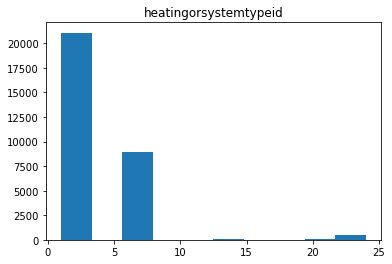

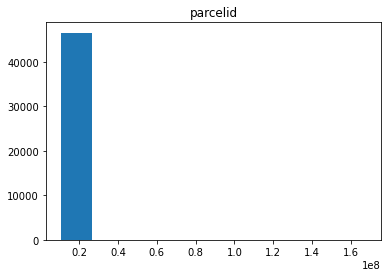

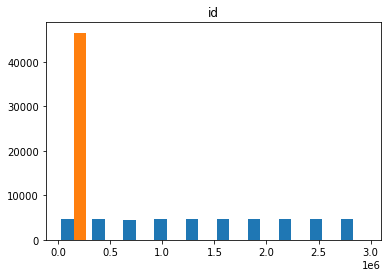

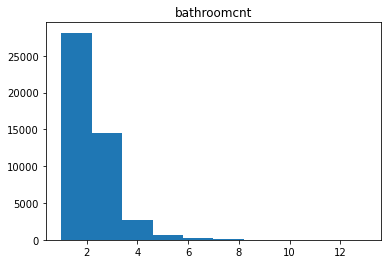

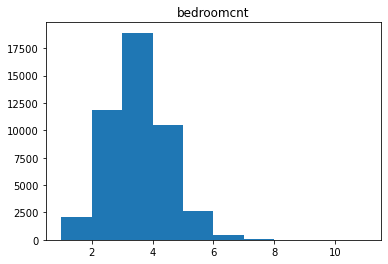

...

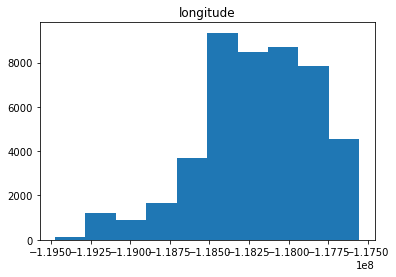

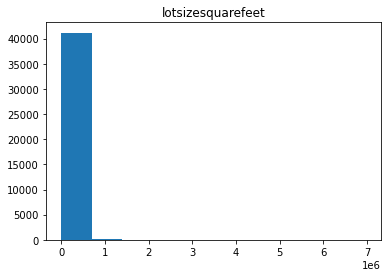

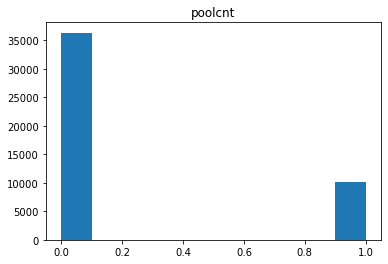

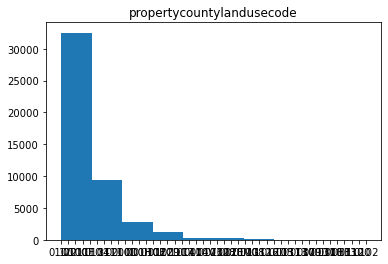

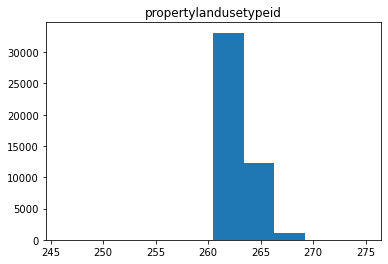

TypeError: 'value' must be an instance of str or bytes, not a None

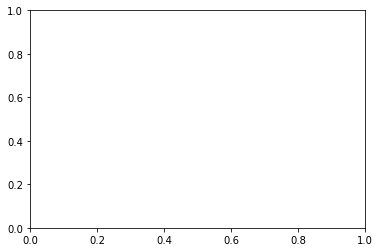

In [18]:
for col in train.columns:
    plt.hist(train[col])
    plt.title(col)
    plt.show()

In [181]:
logmean = train.logerror.mean()

1. Does log error vary by county?

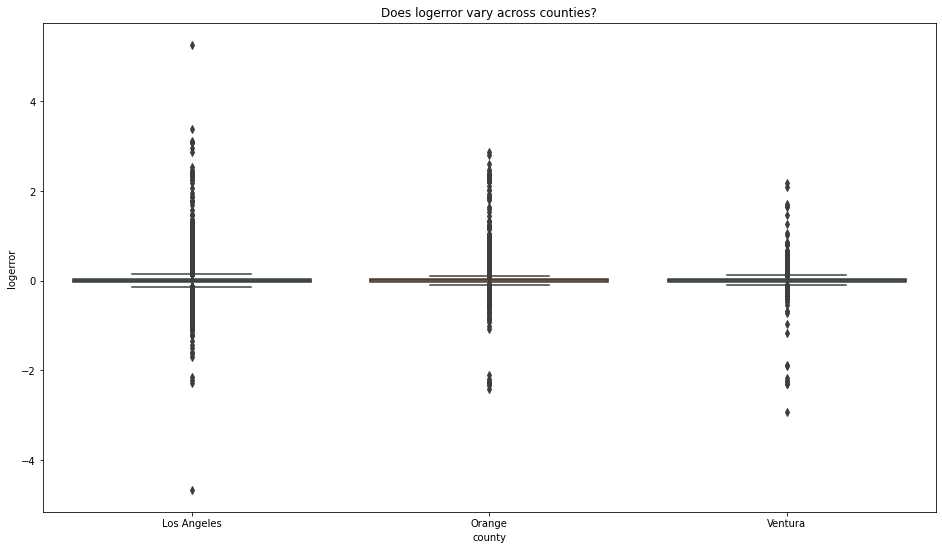

In [19]:
plt.figure(figsize=(16, 9))
sns.boxplot(data = train, x='county', y='logerror')
plt.title('Does logerror vary across counties?')
plt.show()

Los angeles is showing the most outlers and most variance

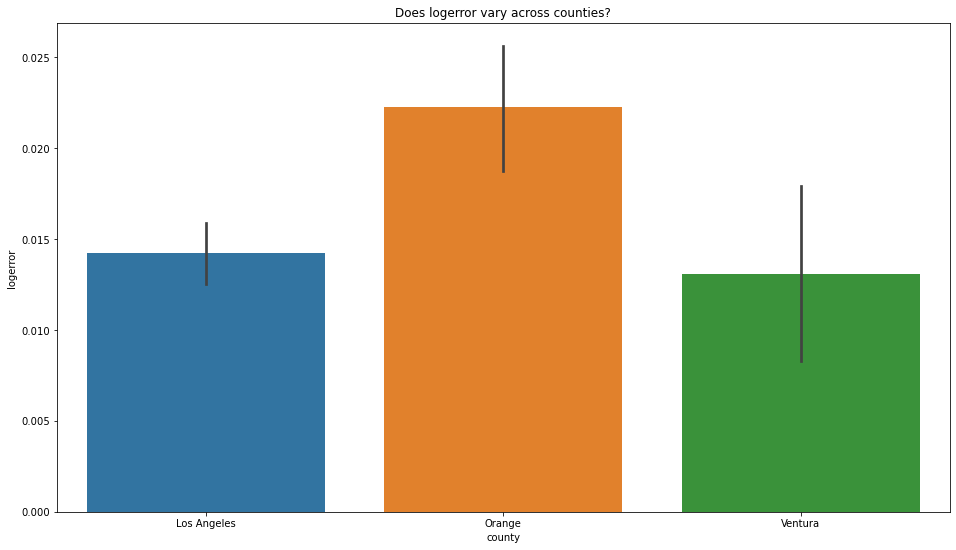

In [119]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='county', y='logerror')
plt.title('Does logerror vary across counties?')
plt.show()

Just wanted another view to see how log error is impacted by county


2. 

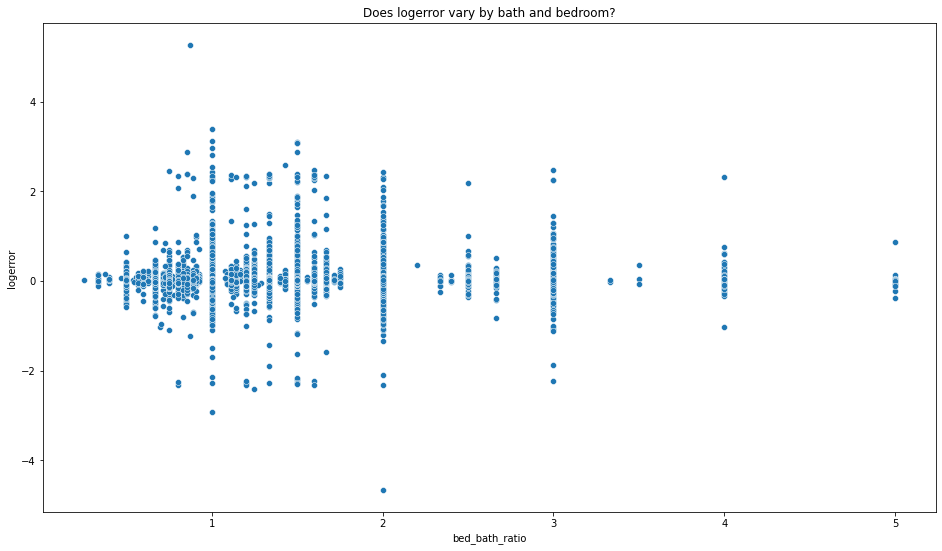

In [38]:
plt.figure(figsize=(16, 9))
sns.scatterplot(data = train, x='bed_bath_ratio', y='logerror')
plt.title('Does logerror vary by bath and bedroom?')
plt.show()

Log error tapers as teh cacluated bath n bedroom count increases

In [36]:
train.regionidcity.value_counts()

12447.0    10452
46298.0     1438
54311.0     1205
5534.0      1193
52650.0     1027
           ...  
31134.0        4
10815.0        2
13311.0        2
21395.0        1
36078.0        1
Name: regionidcity, Length: 175, dtype: int64

In [125]:
train['age_bin'] = pd.cut(train.house_age,[0,25, 50, 75, 100])

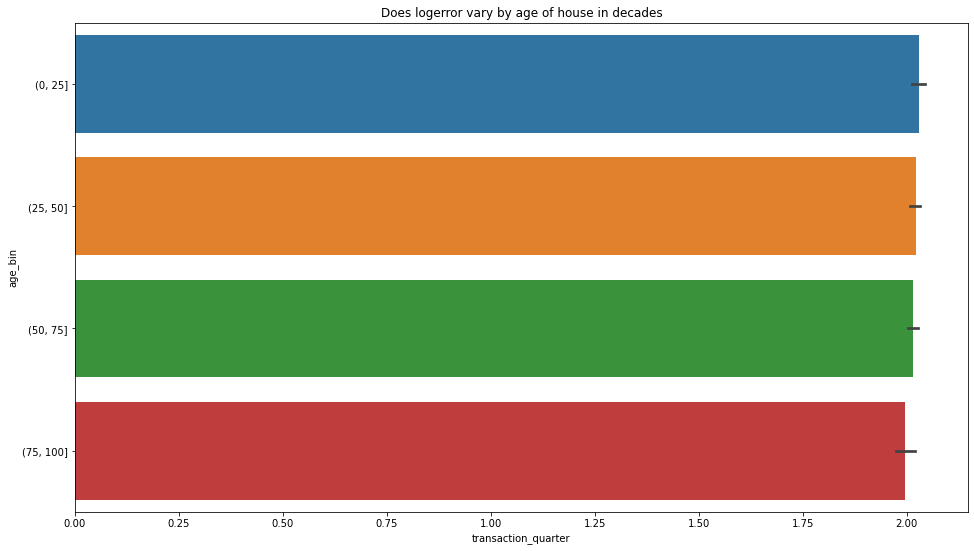

In [128]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='transaction_quarter', y='age_bin')
plt.title('Does logerror vary by age of house in decades')
plt.show()



In [22]:
train = zillow_wrangle.feature_engineering(train)

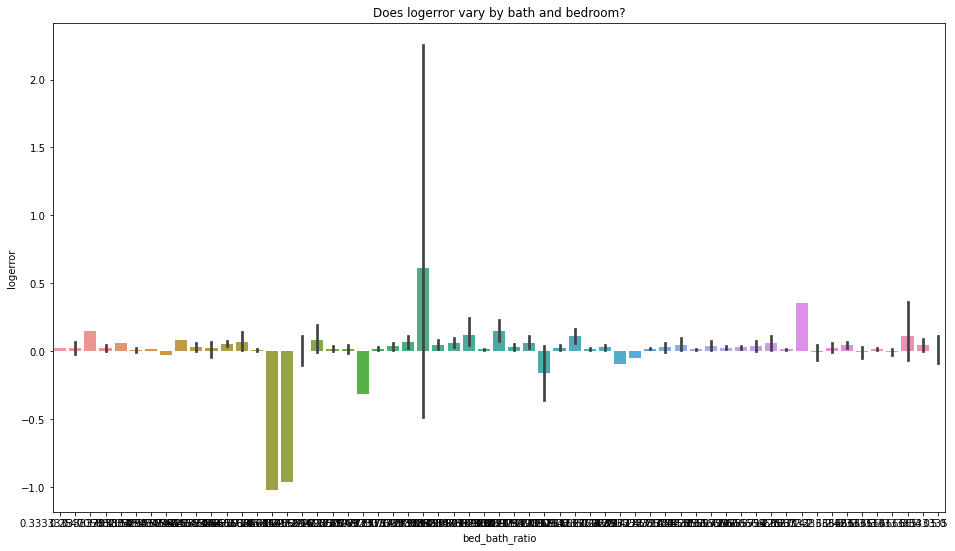

In [116]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='bed_bath_ratio', y='logerror')
plt.title('Does logerror vary by bath and bedroom?')
plt.show()

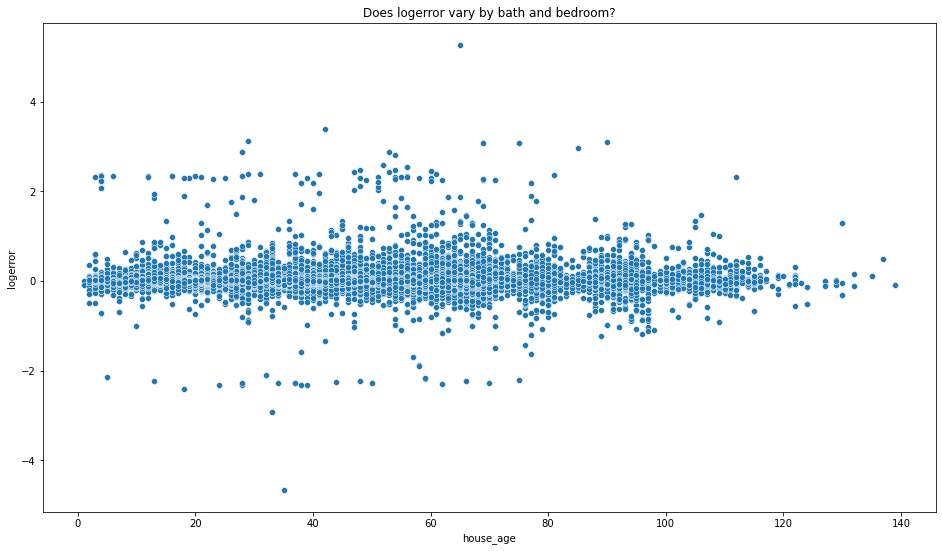

In [24]:
plt.figure(figsize=(16, 9))
sns.scatterplot(data = train, x='house_age', y='logerror')
plt.title('Does logerror vary by bath and bedroom?')
plt.show()

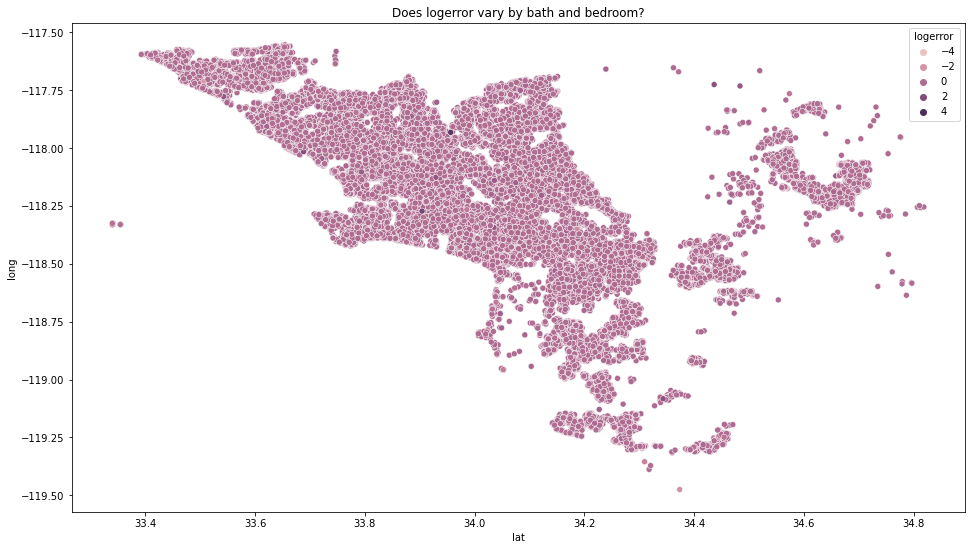

In [26]:
plt.figure(figsize=(16, 9))
sns.scatterplot(data = train, x='lat', y='long', hue= 'logerror')
plt.title('Does logerror vary by bath and bedroom?')
plt.show()

Thus just turned out to be a cool graphic

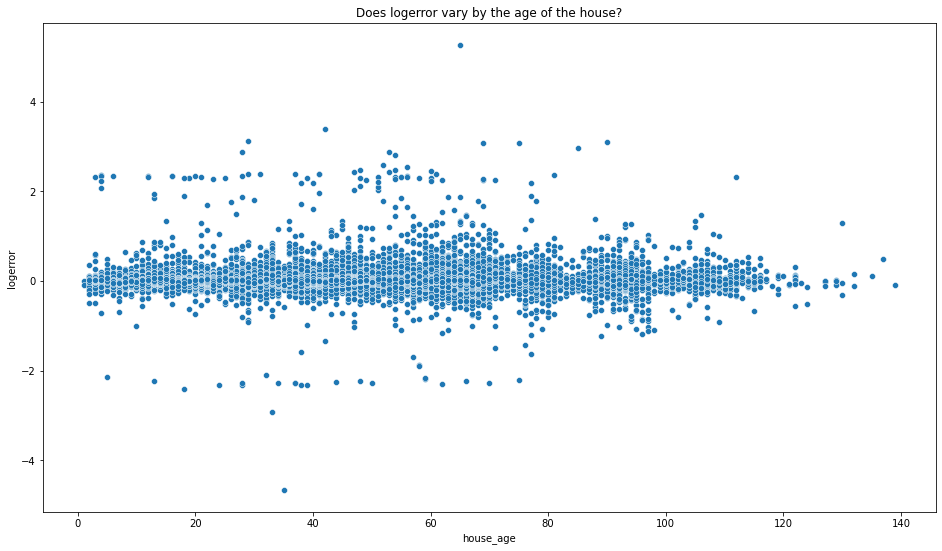

In [49]:
plt.figure(figsize=(16, 9))
sns.scatterplot(data = train, x='house_age', y='logerror')
plt.title('Does logerror vary by the age of the house?')
plt.show()

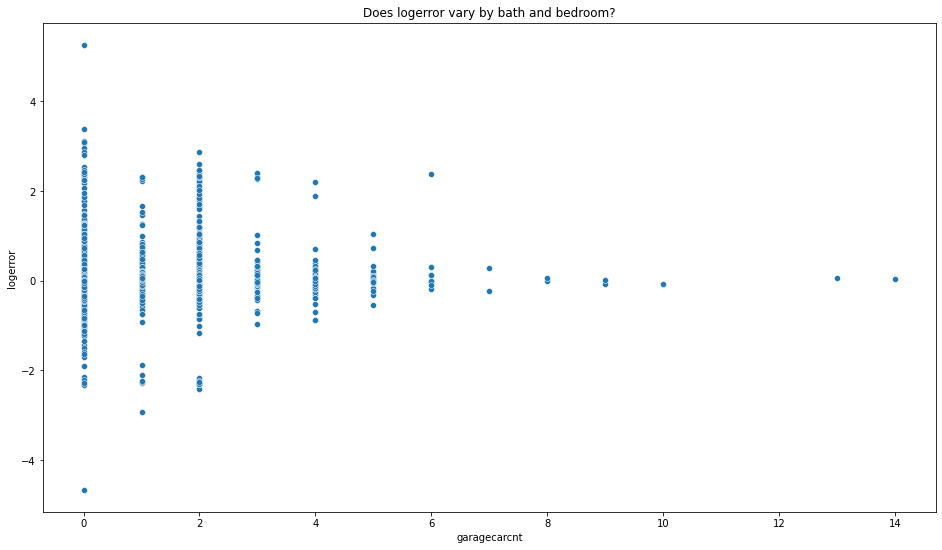

In [33]:
plt.figure(figsize=(16, 9))
sns.scatterplot(data = train, x='garagecarcnt', y='logerror')
plt.title('Does logerror vary by bath and bedroom?')
plt.show()



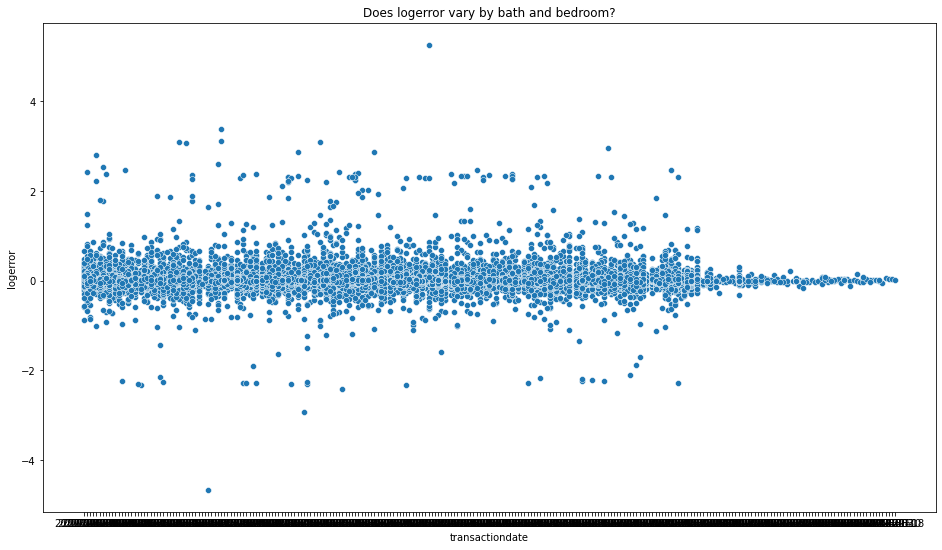

In [35]:
plt.figure(figsize=(16, 9))
sns.scatterplot(data = train, x='transactiondate', y='logerror')
plt.title('Does logerror vary by bath and bedroom?')
plt.show()



In [42]:
train['transactiondate'] = pd.to_datetime(train['transactiondate'], format= '%Y/%m/%d')

In [40]:
def add_date_features(df):
    df["transaction_year"] = df["transactiondate"].dt.year
    df["transaction_month"] = df["transactiondate"].dt.month
    df["transaction_day"] = df["transactiondate"].dt.day
    df["transaction_quarter"] = df["transactiondate"].dt.quarter
    df.drop(["transactiondate"], inplace=True, axis=1)
    return df

In [43]:
train = add_date_features(train)

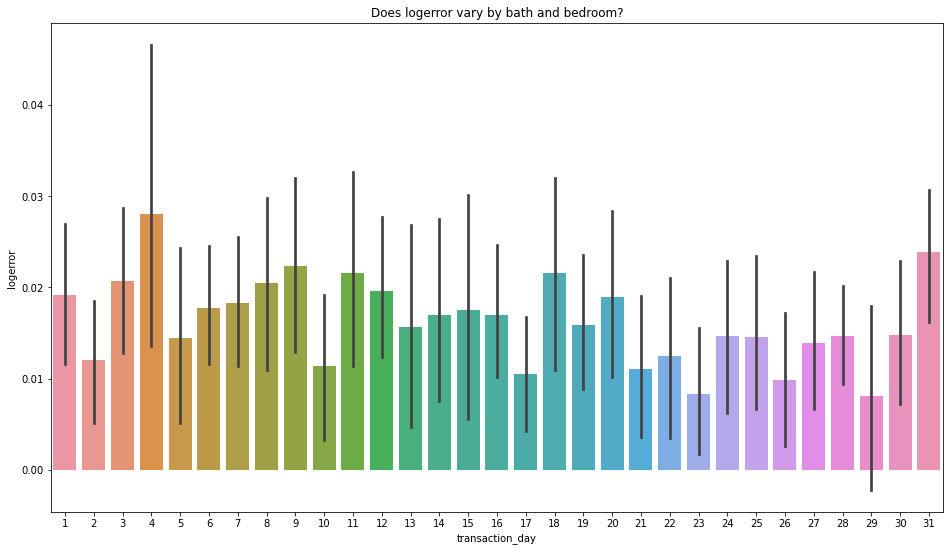

In [118]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='transaction_day', y='logerror')
plt.title('Does logerror vary by bath and bedroom?')
plt.show()

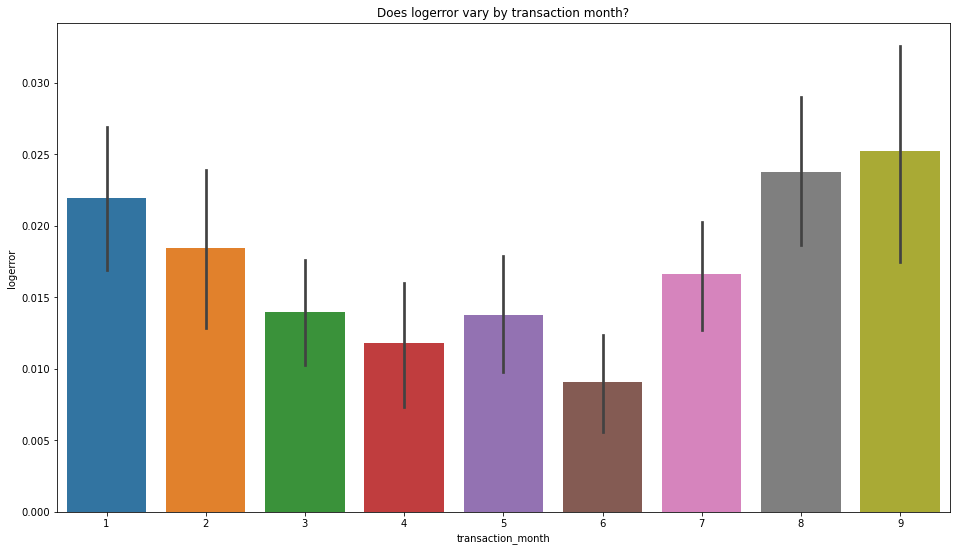

In [52]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='transaction_month', y='logerror')
plt.title('Does logerror vary by transaction month?')
plt.show()


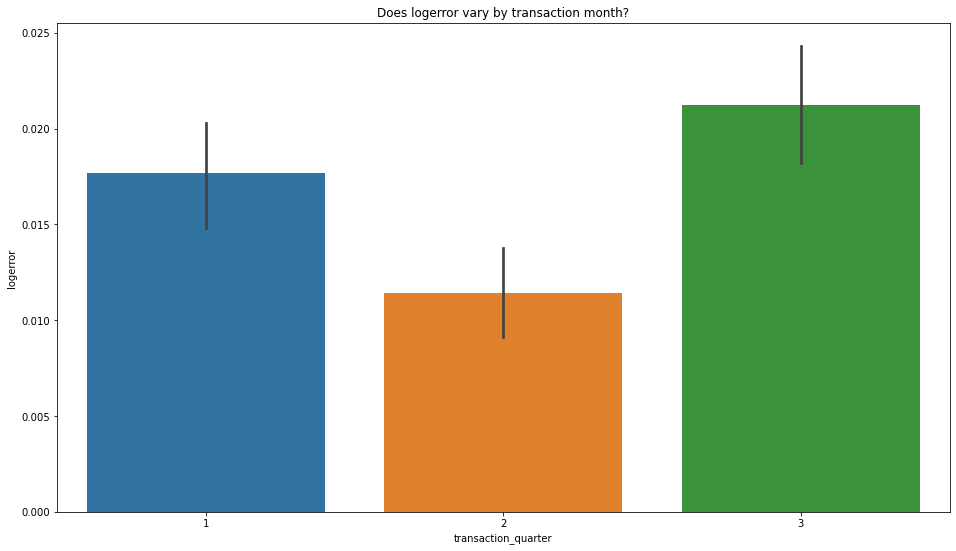

In [53]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='transaction_quarter', y='logerror')
plt.title('Does logerror vary by transaction quarter?')
plt.show()

(array([4220., 3841., 5559., 5208.,    0., 6302., 6870., 5691., 5939.,
        2886.]),
 array([1. , 1.8, 2.6, 3.4, 4.2, 5. , 5.8, 6.6, 7.4, 8.2, 9. ]),
 <BarContainer object of 10 artists>)

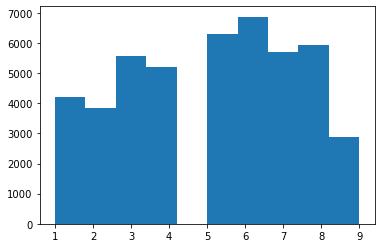

In [55]:
plt.hist(train.transaction_month)

In [103]:
train['coslat'] = train.lat.apply(math.cos)
train['coslong'] = train.long.apply(math.cos)
train['sinlong'] = train.long.apply(math.sin)
train['x'] = train.coslong * train.coslat
train['y'] = train.coslat * train.sinlong
train['z'] = train.latitude.apply(math.sin) 


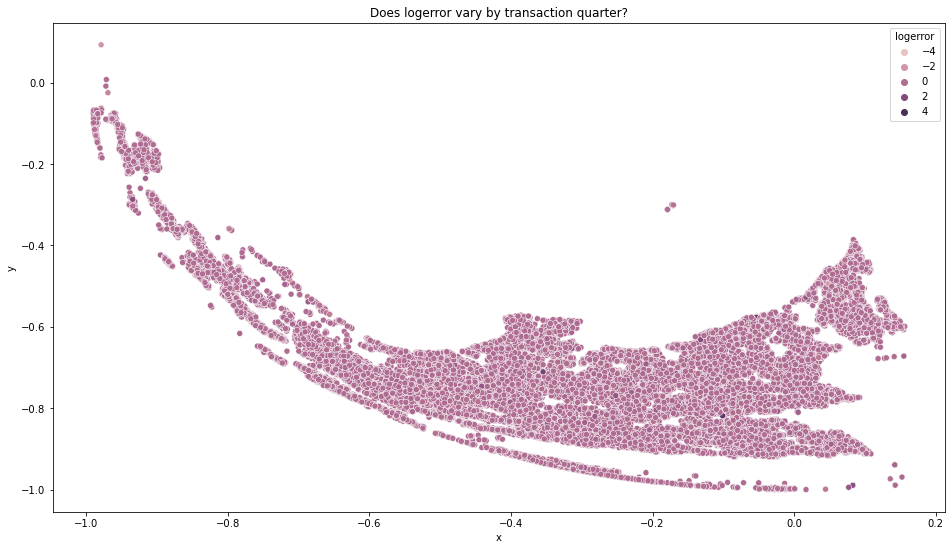

In [105]:
plt.figure(figsize=(16, 9))
sns.scatterplot(data = train, x='x', y='y', hue='logerror')
plt.title('Does logerror vary by transaction quarter?')
plt.show()

In [106]:
import plotly.express as px

fig = px.scatter_3d(train, x='x', y='y', z='z',
              color='taxvaluedollarcnt')
fig.update_layout(width=900, height=900)
# fig.update_layout(margin={"r":0,"t":0,"l":10,"b":0})
fig.show()

In [107]:
def cart2pol(x, y):
    rho = np.sqrt(x**2 + y**2)
    phi = np.arctan2(y, x)
    return rho, phi



In [108]:
train['rho'], train['phi'] = cart2pol(train.x, train.y)

In [85]:
train.columns

Index(['heatingorsystemtypeid', 'parcelid', 'id', 'bathroomcnt', 'bedroomcnt',
       'buildingqualitytypeid', 'calculatedbathnbr',
       'calculatedfinishedsquarefeet', 'finishedsquarefeet12', 'fips',
       'fullbathcnt', 'garagecarcnt', 'latitude', 'longitude',
       'lotsizesquarefeet', 'poolcnt', 'propertycountylandusecode',
       'propertylandusetypeid', 'propertyzoningdesc', 'rawcensustractandblock',
       'regionidcity', 'regionidcounty', 'regionidzip', 'roomcnt', 'unitcnt',
       'yearbuilt', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt',
       'assessmentyear', 'landtaxvaluedollarcnt', 'taxamount',
       'censustractandblock', 'id', 'logerror', 'heatingorsystemdesc',
       'county', 'pool_encoded', 'lat', 'long', 'bed_bath_ratio', 'house_age',
       'transaction_year', 'transaction_month', 'transaction_day',
       'transaction_quarter', 'coslat', 'coslong', 'sinlong', 'x', 'y', 'z',
       'rho', 'phi'],
      dtype='object')

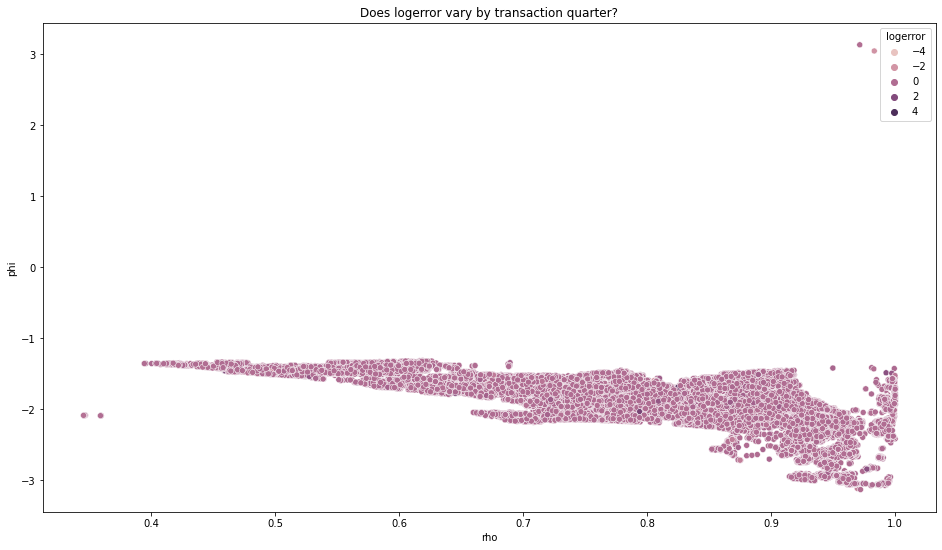

In [113]:
plt.figure(figsize=(16, 9))
sns.scatterplot(data = train, x='rho', y='phi', hue='logerror')
plt.title('Does logerror vary by transaction quarter?')
plt.show()

In [130]:
train['polar_combo'] = train.rho * train.phi

might have to create new feature rho * phi to contain comnbo of features or pass rho and phi into clustering model to pull out observations and label

<AxesSubplot:>

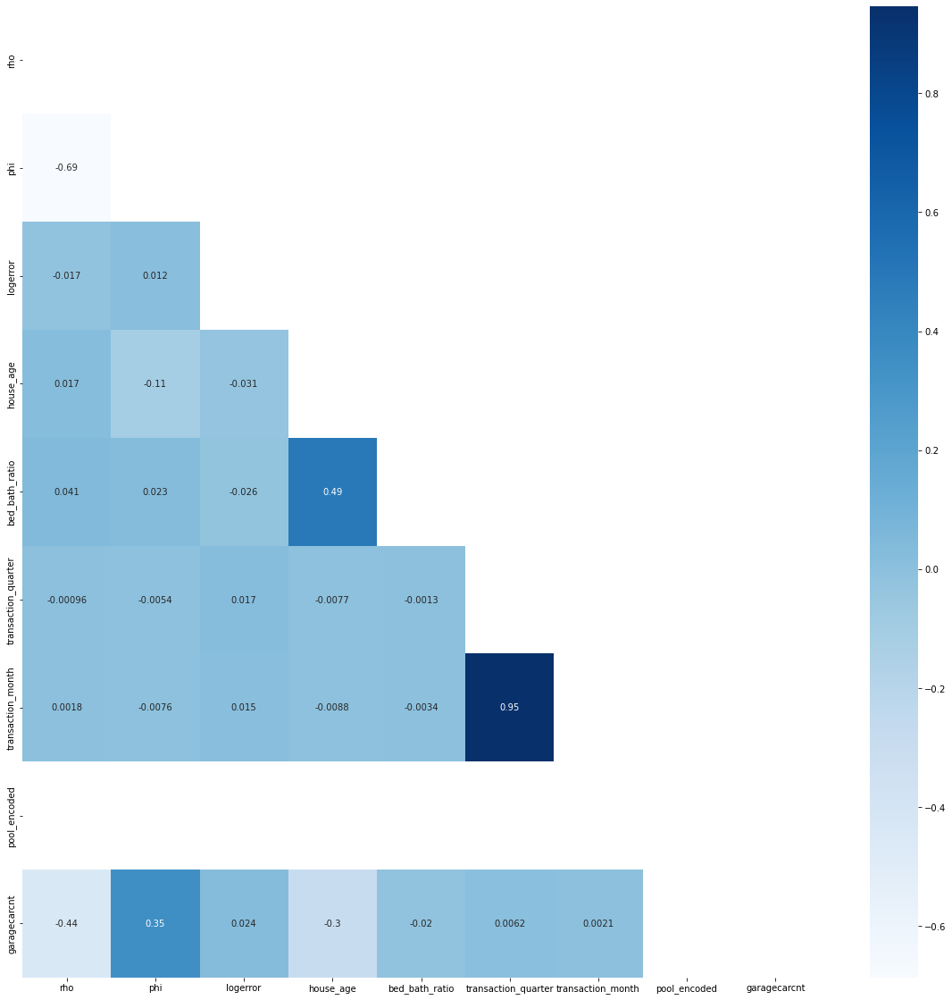

In [112]:
# making a correlation table using spearman becuase data is not normally distributed
correlation_table = train[['rho', 'phi', 'logerror', 'house_age', 'bed_bath_ratio', 'transaction_quarter', 'transaction_month', 'pool_encoded', 'garagecarcnt']].corr(method='spearman')

# Declaring a size for the heatmap and making heatmap to see the correlations between all variables in the dataset
plt.figure(figsize= (20,20))
sns.heatmap(correlation_table, cmap='Blues', annot = True, mask = np.triu(correlation_table))

# 
---
 # Questions after exploring

## Q1 - Does log error varry by county?

Ho Log error is the same across counties
Ha - Log error is not the same across counties

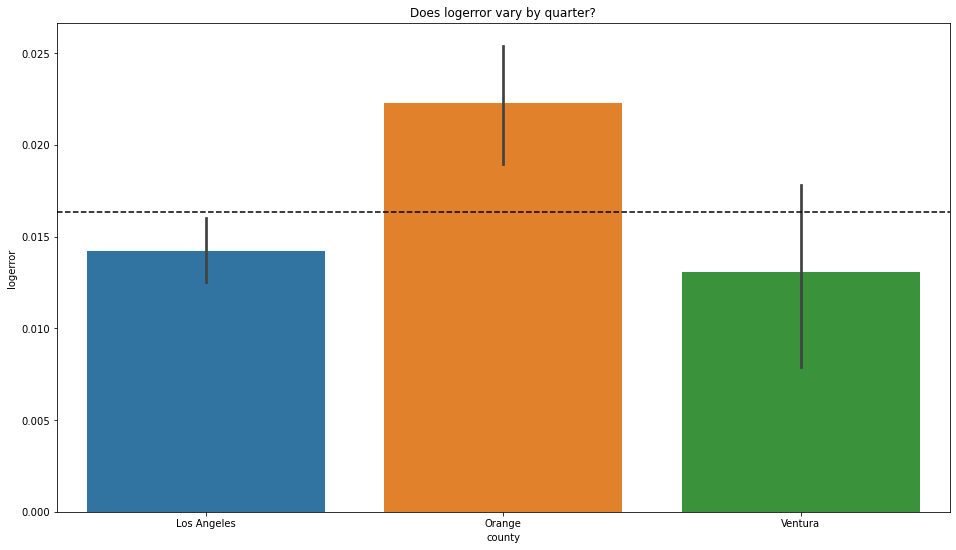

In [182]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='county', y='logerror')
plt.title('Does logerror vary by quarter?')
plt.axhline(logmean, ls = '--', color = 'black')
plt.show()

## Q - Is log error significantly different between quarters?
Ho - The log error is the same across al quarters
Ha - There is difference between log error and quarters

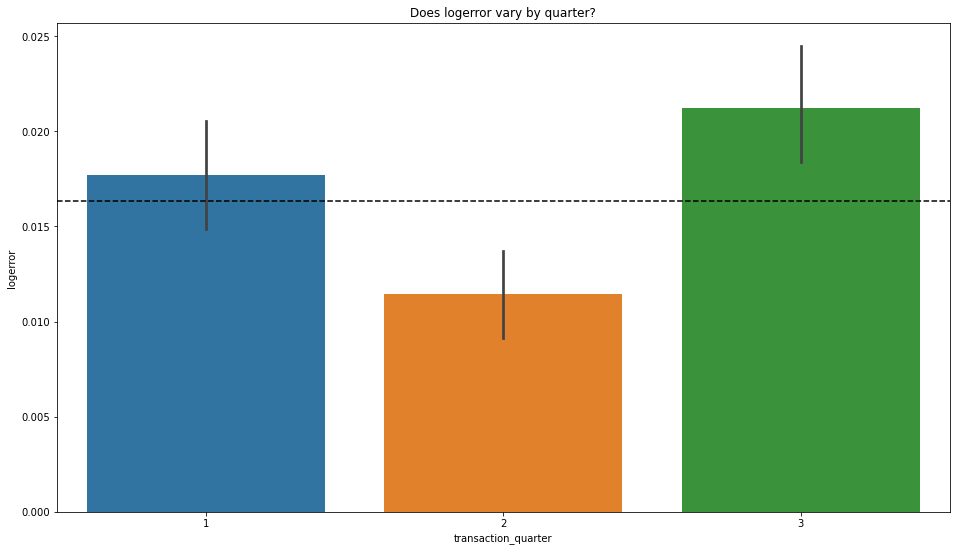

In [183]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='transaction_quarter', y='logerror')
plt.title('Does logerror vary by quarter?')
plt.axhline(logmean, ls = '--', color = 'black')
plt.show()

Q3 - Why is the log error higher in q3 than all other data sets? Is it due the ages of houses being sold?



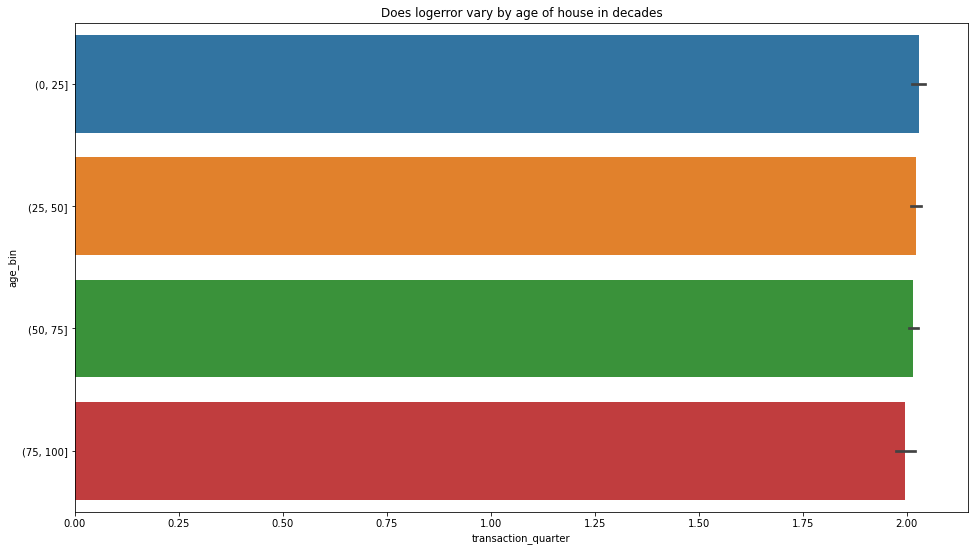

In [129]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='transaction_quarter', y='age_bin')
plt.title('Does logerror vary by age of house in decades')
plt.show()


q3 - Does the difference relate to where the houses were sold during the quater?

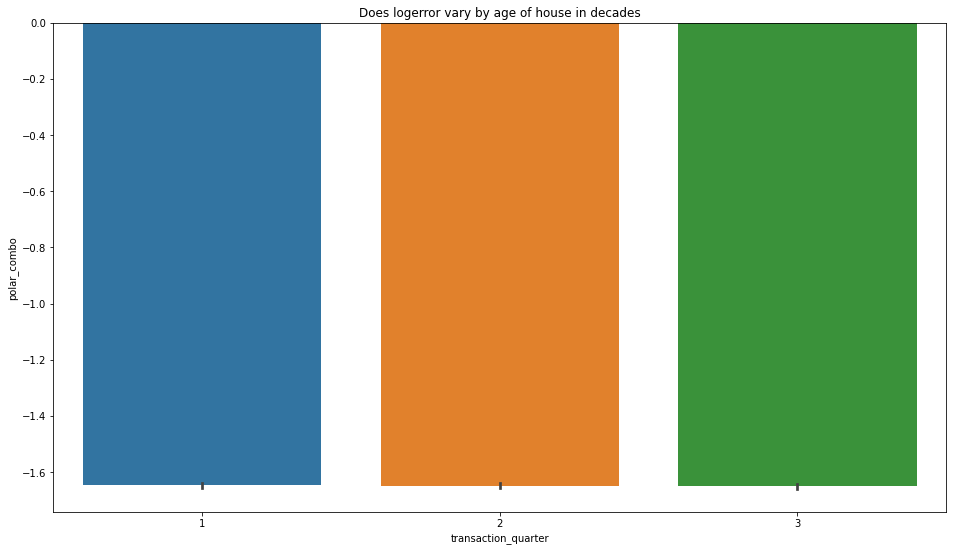

In [131]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='transaction_quarter', y='polar_combo')
plt.title('Does logerror vary by age of house in decades')
plt.show()

In [133]:
fig = px.scatter_3d(train, x='rho', y='phi', z='transaction_quarter'
              )
fig.update_layout(width=900, height=900)
# fig.update_layout(margin={"r":0,"t":0,"l":10,"b":0})
fig.show()

Are the size of houses different in each quarter?



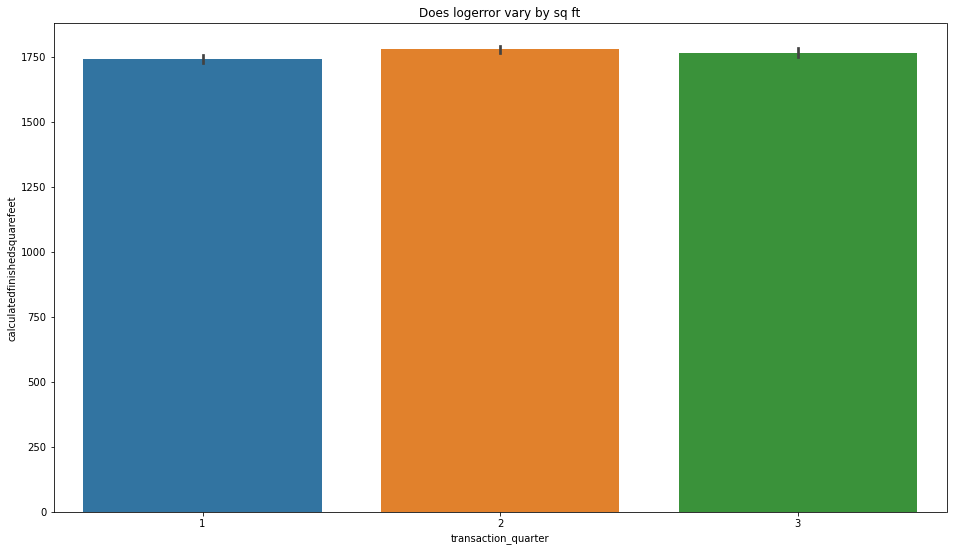

In [135]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='transaction_quarter', y='calculatedfinishedsquarefeet')
plt.title('Does logerror vary by sq ft')
plt.show()

Do houses sold during the  quarter have a different bed bath ratio?

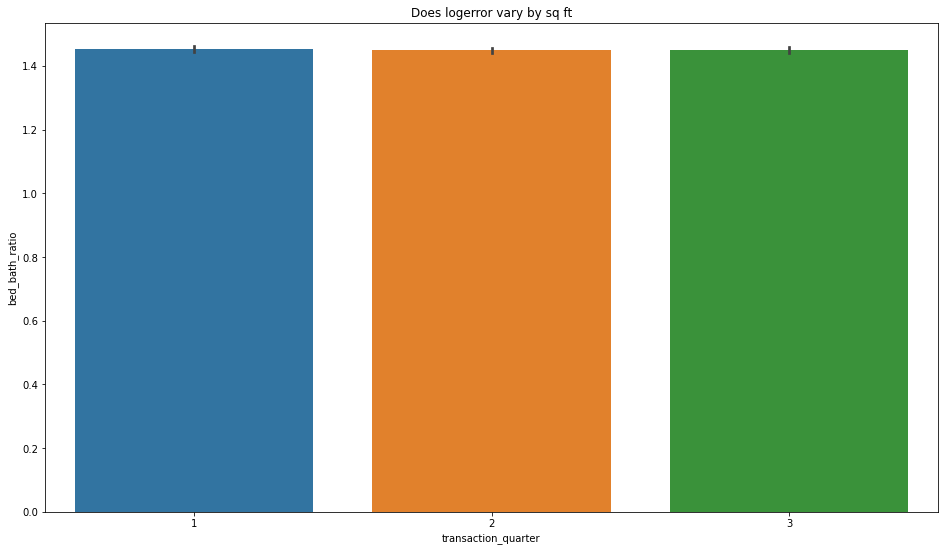

In [136]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='transaction_quarter', y='bed_bath_ratio')
plt.title('Does logerror vary by sq ft')
plt.show()

something else is causing a correlation that may drive the relationship 

In [137]:
train['age_decade'] = pd.cut(train.house_age,[0,10, 20, 30, 40, 50, 60, 70, 80, 90, 100])

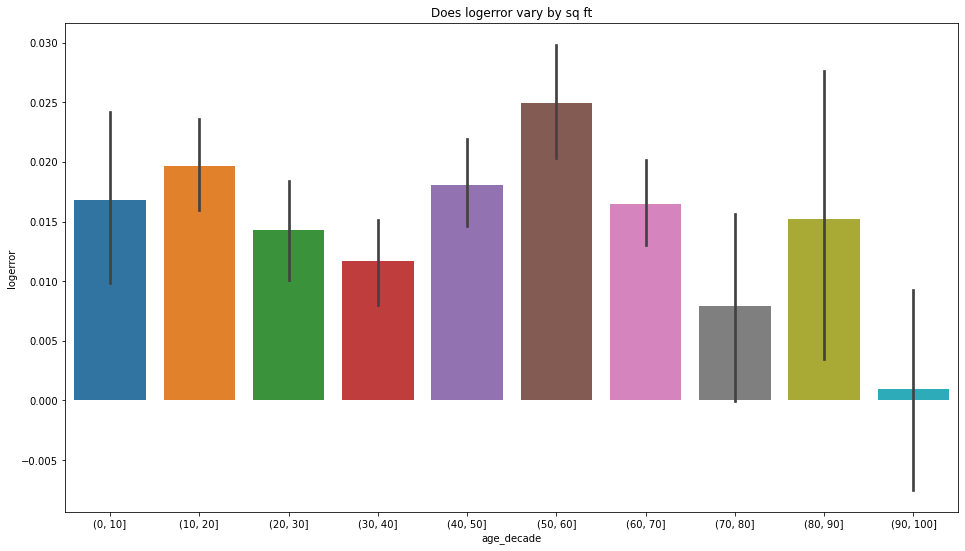

In [138]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='age_decade', y='logerror')
plt.title('Does logerror vary by sq ft')
plt.show()

## Q - Does the age of a home influence log error?

Ho - There is no difference in log error and home age
Ha - there is a difference in log error and home age

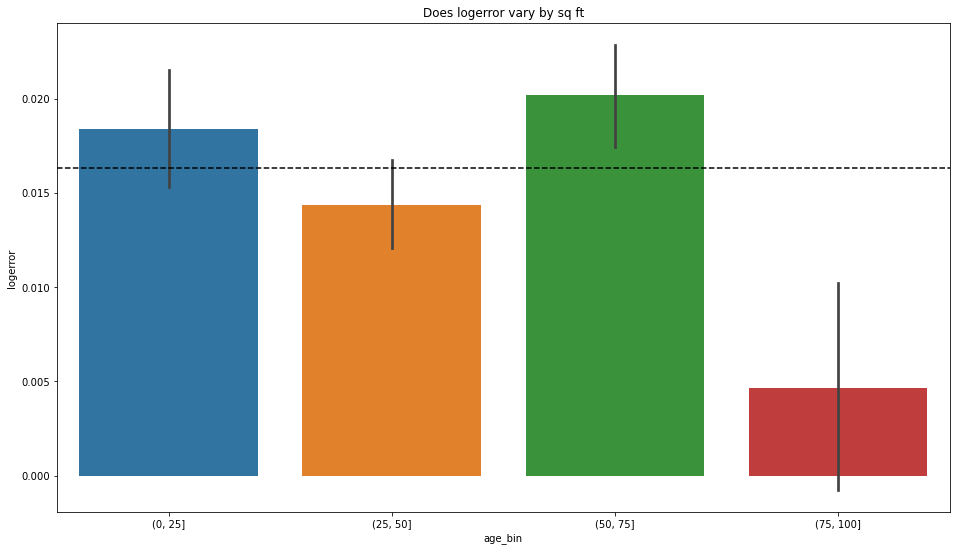

In [184]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='age_bin', y='logerror')
plt.title('Does logerror vary by sq ft')
plt.axhline(logmean, ls = '--', color = 'black')
plt.show()

Does house age in quarters have same sq footage?

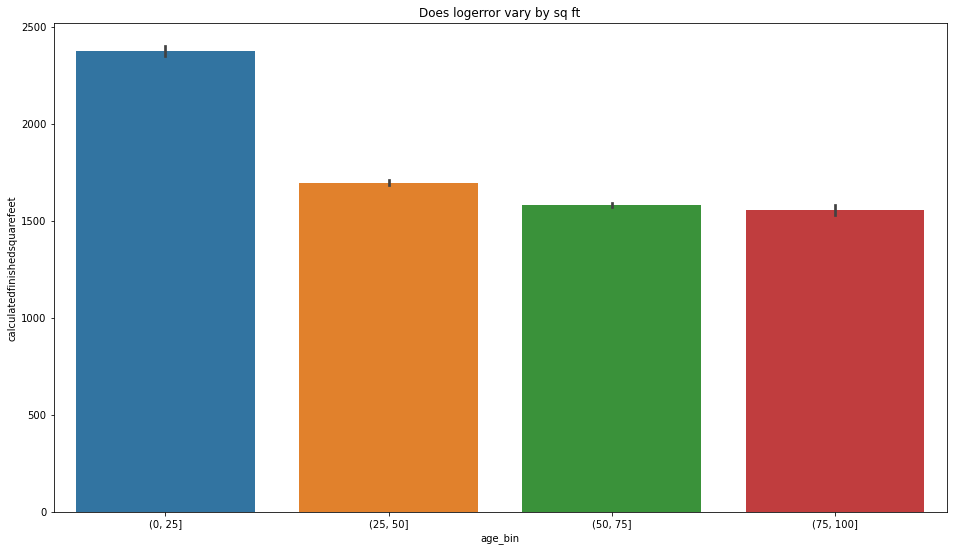

In [140]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='age_bin', y='calculatedfinishedsquarefeet')
plt.title('Does logerror vary by sq ft')
plt.show()

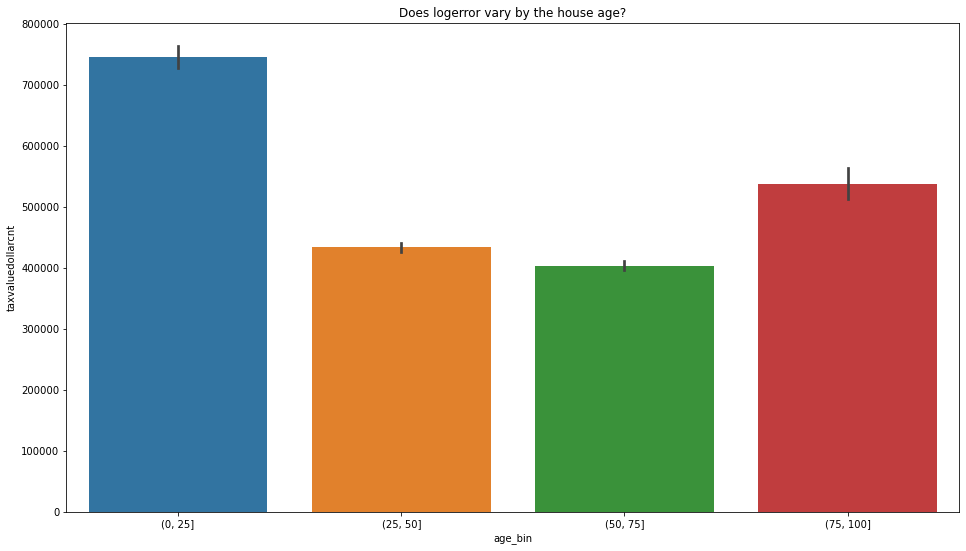

In [163]:
# looking at house age bin vs tax value dollar count
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='age_bin', y='taxvaluedollarcnt')
plt.title('Does logerror vary by the house age?')
plt.show()

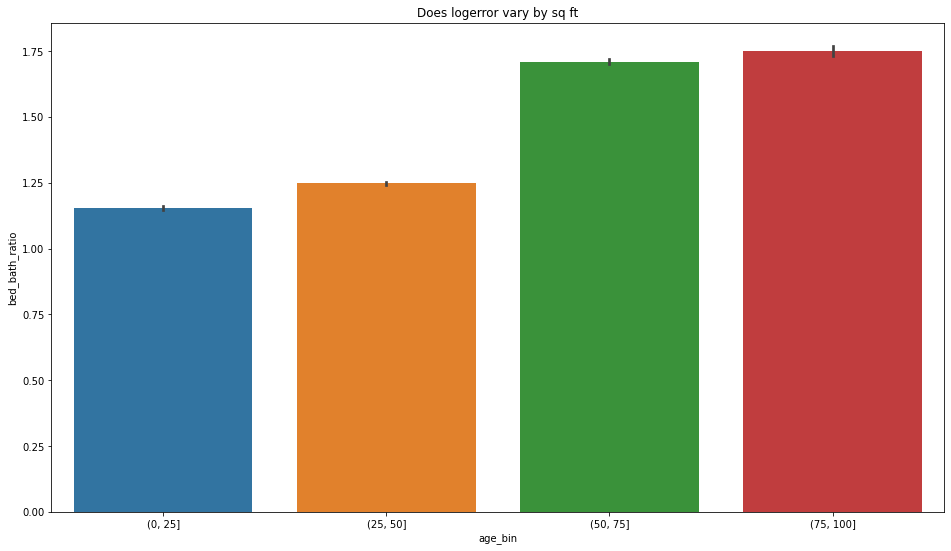

In [142]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='age_bin', y='bed_bath_ratio')
plt.title('Does logerror vary by sq ft')
plt.show()

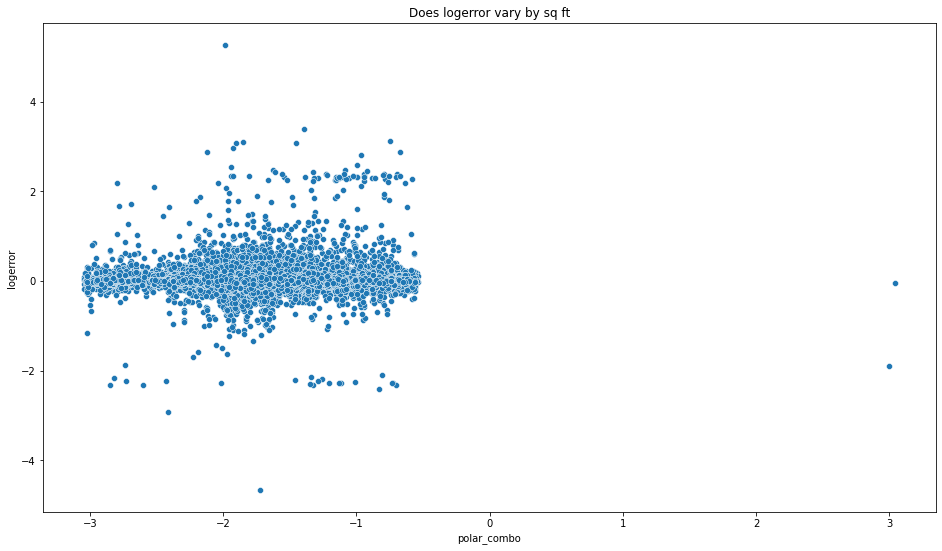

In [145]:
plt.figure(figsize=(16, 9))
sns.scatterplot(data = train, x='polar_combo', y='logerror')
plt.title('Does logerror vary by sq ft')
plt.show()

In [165]:
train['polar_bin'] = pd.qcut(train['polar_combo'],q=6)

In [156]:
train.head()

,heatingorsystemtypeid,parcelid,id,bathroomcnt,bedroomcnt,buildingqualitytypeid,calculatedbathnbr,calculatedfinishedsquarefeet,finishedsquarefeet12,fips,...,sinlong,x,y,z,rho,phi,age_bin,polar_combo,age_decade,polar_bin
4339,2.0,11251554,2404166,2.0,4.0,8.0,2.0,2032.0,2032.0,6037.0,...,0.999842,-0.017753,-0.998866,-0.521466,0.999024,-1.588568,"(25, 50]",-1.587018,"(40, 50]","(-1.637, -1.315]"
22351,7.0,11938715,2153180,1.0,1.0,4.0,1.0,1987.0,1987.0,6037.0,...,0.905343,-0.377948,-0.805718,0.482962,0.889958,-2.009406,"(75, 100]",-1.788288,"(70, 80]","(-1.975, -1.637]"
53015,7.0,12148463,409101,1.0,3.0,4.0,1.0,1050.0,1050.0,6037.0,...,0.905995,-0.401467,-0.859290,0.547680,0.948449,-2.007868,"(50, 75]",-1.904361,"(60, 70]","(-1.975, -1.637]"
54453,NaN,14307758,2115193,2.0,3.0,NaN,2.0,1440.0,1440.0,6059.0,...,0.999996,0.001833,-0.634227,0.980430,0.634229,-1.567907,"(25, 50]",-0.994412,"(30, 40]","(-1.315, 3.044]"
75406,2.0,11488119,868814,2.0,3.0,8.0,2.0,1229.0,1229.0,6037.0,...,0.851199,-0.408342,-0.662256,-0.898203,0.778027,-2.123327,"(25, 50]",-1.652006,"(20, 30]","(-1.975, -1.637]"


## Q4 - Does the location of the home have the same log error?

Ho - The logerror is the same across locations
Ha - The logerror is not the same across locations

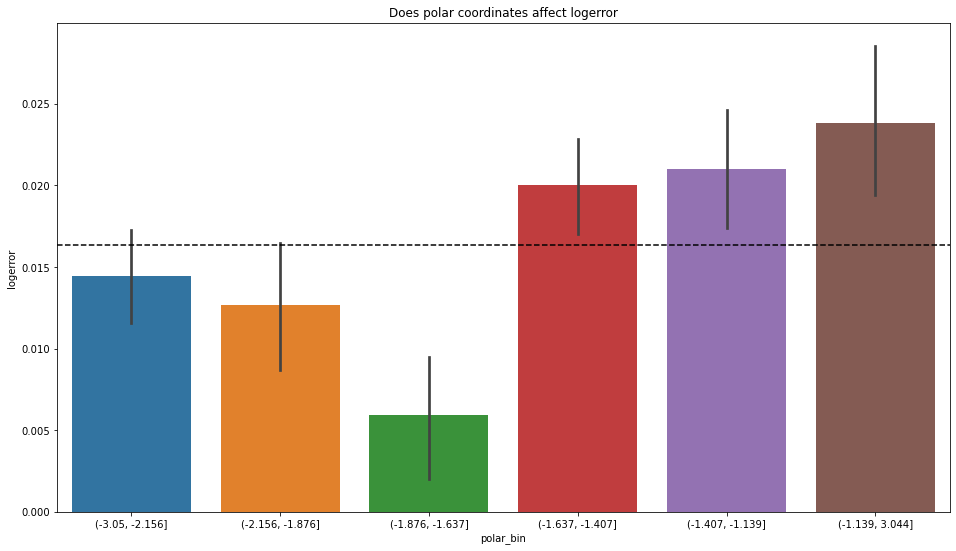

In [185]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='polar_bin', y='logerror')
plt.title('Does polar coordinates affect logerror')
plt.axhline(logmean, ls = '--', color = 'black')
plt.show()

In [175]:
train.censustractandblock.value_counts()

6.037137e+13    37
6.037277e+13    34
6.037139e+13    32
6.037920e+13    28
6.059032e+13    27
                ..
6.037651e+13     1
6.037185e+13     1
6.037229e+13     1
6.059022e+13     1
6.059063e+13     1
Name: censustractandblock, Length: 27566, dtype: int64

In [1]:
train['block_bin'] = pd.qcut(train['censustractandblock'],q=3)



NameError: name 'pd' is not defined

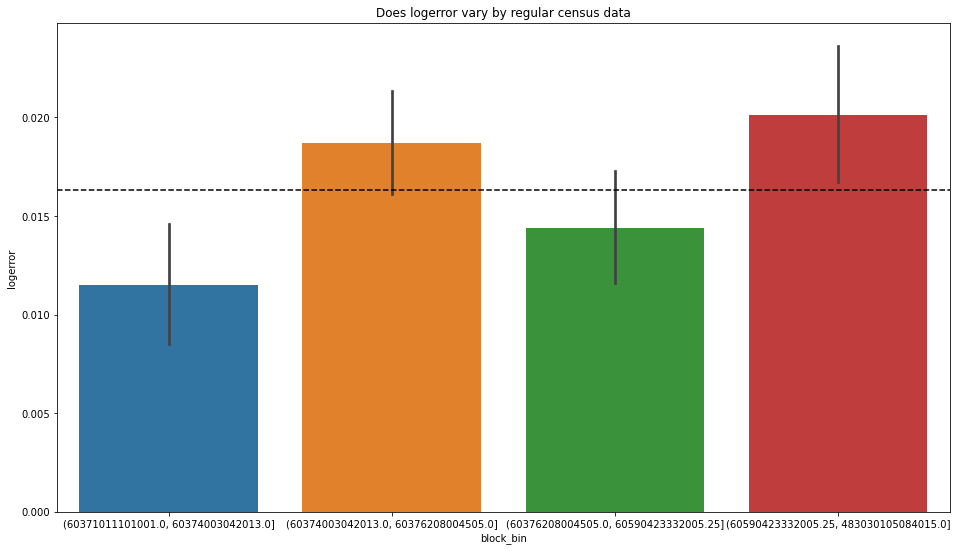

In [191]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='block_bin', y='logerror')
plt.title('Does logerror vary by regular census data')
plt.axhline(logmean, ls = '--', color = 'black')
plt.show()

In [176]:
train['racw_cen_bin'] = pd.qcut(train['rawcensustractandblock'],q=4)

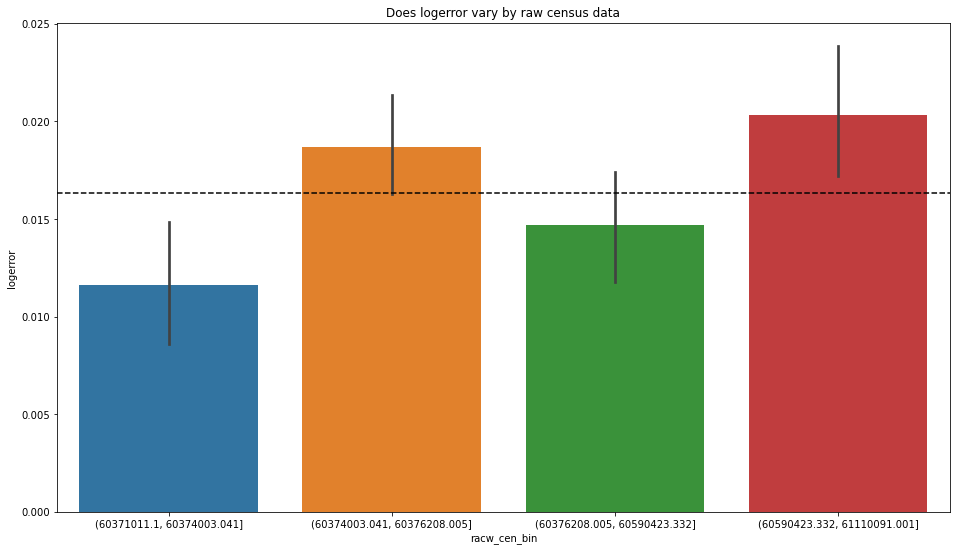

In [190]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='racw_cen_bin', y='logerror')
plt.title('Does logerror vary by raw census data')
plt.axhline(logmean, ls = '--', color = 'black')
plt.show()

In [178]:
train['binbedbath'] = pd.qcut(train['bed_bath_ratio'],q=4)

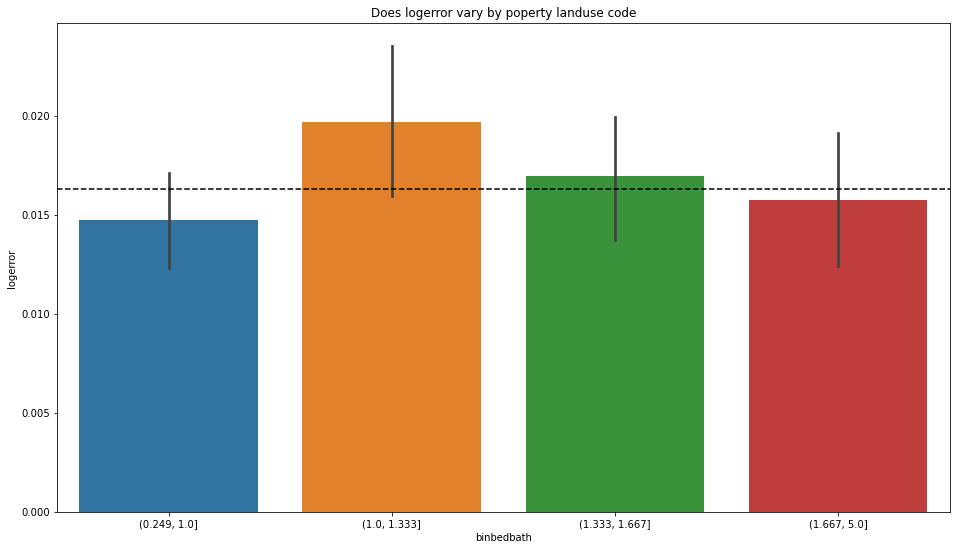

In [189]:
plt.figure(figsize=(16, 9))
sns.barplot(data = train, x='binbedbath', y='logerror')
plt.title('Does logerror vary by poperty landuse code')
plt.axhline(logmean, ls = '--', color = 'black')
plt.show()

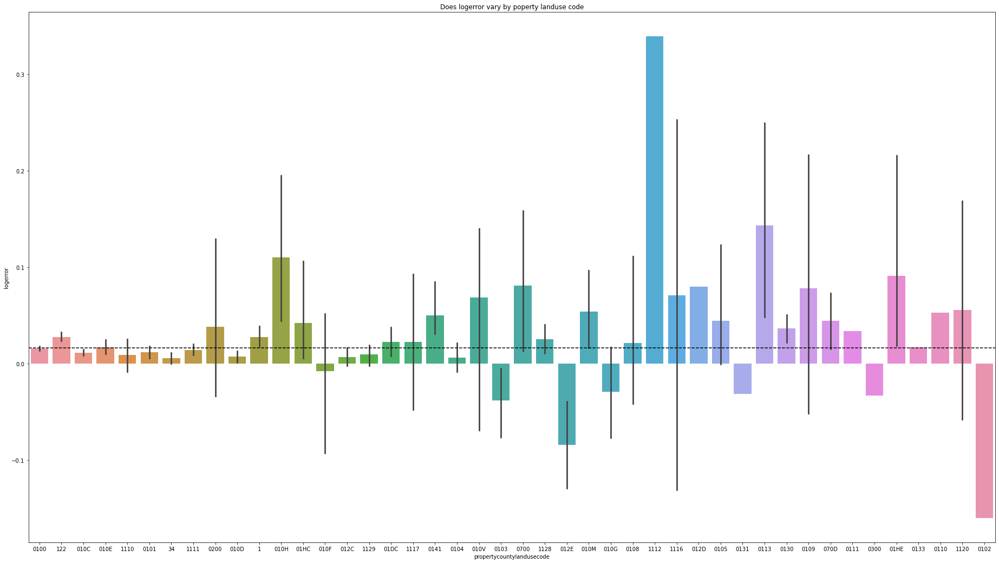

In [188]:
plt.figure(figsize=(32, 18))
sns.barplot(data = train, x='propertycountylandusecode', y='logerror')
plt.title('Does logerror vary by poperty landuse code')
plt.axhline(logmean, ls = '--', color = 'black')
plt.show()